- Ananya Rai

In [44]:
import os
import librosa

import pandas as pd
import IPython.display as ipd
import matplotlib.pyplot as plt
import seaborn as sns
import soundfile as sf
import numpy as np

from sklearn.model_selection import train_test_split

Loading the dataset

In [47]:
# LOADING THE DATASET

path = 'dataset/'
try:
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            print(os.path.join(dirname, filename))

except OSError as e:
    print(e)

dataset/.DS_Store
dataset/Gujarati/14788.mp3
dataset/Gujarati/23124.mp3
dataset/Gujarati/24893.mp3
dataset/Gujarati/15496.mp3
dataset/Gujarati/25555.mp3
dataset/Gujarati/14950.mp3
dataset/Gujarati/21733.mp3
dataset/Gujarati/17281.mp3
dataset/Gujarati/11828.mp3
dataset/Gujarati/28071.mp3
dataset/Gujarati/27342.mp3
dataset/Gujarati/16821.mp3
dataset/Gujarati/28717.mp3
dataset/Gujarati/10288.mp3
dataset/Gujarati/27424.mp3
dataset/Gujarati/21055.mp3
dataset/Gujarati/29409.mp3
dataset/Gujarati/11196.mp3
dataset/Gujarati/25233.mp3
dataset/Gujarati/9842.mp3
dataset/Gujarati/13959.mp3
dataset/Gujarati/8584.mp3
dataset/Gujarati/23642.mp3
dataset/Gujarati/13781.mp3
dataset/Gujarati/25227.mp3
dataset/Gujarati/9856.mp3
dataset/Gujarati/8590.mp3
dataset/Gujarati/22548.mp3
dataset/Gujarati/23656.mp3
dataset/Gujarati/13795.mp3
dataset/Gujarati/24139.mp3
dataset/Gujarati/28703.mp3
dataset/Gujarati/16835.mp3
dataset/Gujarati/27430.mp3
dataset/Gujarati/21041.mp3
dataset/Gujarati/11182.mp3
dataset/Gujara

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




dataset/Bengali/26146.mp3
dataset/Bengali/11932.mp3
dataset/Bengali/20537.mp3
dataset/Bengali/14692.mp3
dataset/Bengali/24751.mp3
dataset/Bengali/22320.mp3
dataset/Bengali/24989.mp3
dataset/Bengali/14686.mp3
dataset/Bengali/24745.mp3
dataset/Bengali/22334.mp3
dataset/Bengali/15598.mp3
dataset/Bengali/16091.mp3
dataset/Bengali/26152.mp3
dataset/Bengali/5810.mp3
dataset/Bengali/11926.mp3
dataset/Bengali/20523.mp3
dataset/Bengali/20245.mp3
dataset/Bengali/10386.mp3
dataset/Bengali/18902.mp3
dataset/Bengali/26634.mp3
dataset/Bengali/11098.mp3
dataset/Bengali/2819.mp3
dataset/Bengali/884.mp3
dataset/Bengali/22452.mp3
dataset/Bengali/13857.mp3
dataset/Bengali/23994.mp3
dataset/Bengali/12591.mp3
dataset/Bengali/7961.mp3
dataset/Bengali/24023.mp3
dataset/Bengali/9794.mp3
dataset/Bengali/1647.mp3
dataset/Bengali/13300.mp3
dataset/Bengali/6128.mp3
dataset/Bengali/15771.mp3
dataset/Bengali/8105.mp3
dataset/Bengali/7236.mp3
dataset/Bengali/11517.mp3
dataset/Bengali/3050.mp3
dataset/Bengali/20912.

In [48]:
path = 'dataset/'
data_amp_dur = []

for class_ in os.listdir(path):
    class_path = os.path.join(path, class_)
    for file in os.listdir(class_path):
        if file.endswith('.mp3'):
            file_path = os.path.join(class_path, file)
            try:
                y, sr = librosa.load(file_path, sr=None)
                if y.size == 0:  # Skip empty audio files
                    print(f"Skipping empty file: {file_path}")
                    continue
            except Exception as e:
                print(f"Error loading {file_path}: {e}")
                continue

            duration = librosa.get_duration(y=y, sr=sr)

            data_amp_dur.append({
                'file' : file,
                'min_amp' : np.min(y),
                'max_amp' : np.max(y),
                'mean_amp' : np.mean(y),
                'std_amp' : np.std(y),
                'duration' : duration,
                'class' : class_
            })

        print(file_path)

df_amp_dur = pd.DataFrame(data_amp_dur)

dataset/Gujarati/14788.mp3
dataset/Gujarati/23124.mp3
dataset/Gujarati/24893.mp3
dataset/Gujarati/15496.mp3
dataset/Gujarati/25555.mp3
dataset/Gujarati/14950.mp3
dataset/Gujarati/21733.mp3
dataset/Gujarati/17281.mp3
dataset/Gujarati/11828.mp3
dataset/Gujarati/28071.mp3
dataset/Gujarati/27342.mp3
dataset/Gujarati/16821.mp3
dataset/Gujarati/28717.mp3
dataset/Gujarati/10288.mp3
dataset/Gujarati/27424.mp3
dataset/Gujarati/21055.mp3
dataset/Gujarati/29409.mp3
dataset/Gujarati/11196.mp3
dataset/Gujarati/25233.mp3
dataset/Gujarati/9842.mp3
dataset/Gujarati/13959.mp3
dataset/Gujarati/8584.mp3
dataset/Gujarati/23642.mp3
dataset/Gujarati/13781.mp3
dataset/Gujarati/25227.mp3
dataset/Gujarati/9856.mp3
dataset/Gujarati/8590.mp3
dataset/Gujarati/22548.mp3
dataset/Gujarati/23656.mp3
dataset/Gujarati/13795.mp3
dataset/Gujarati/24139.mp3
dataset/Gujarati/28703.mp3
dataset/Gujarati/16835.mp3
dataset/Gujarati/27430.mp3
dataset/Gujarati/21041.mp3
dataset/Gujarati/11182.mp3
dataset/Gujarati/18818.mp3
datas

/var/folders/ft/ksjmg7nn2tl18xwghcvb4j0r0000gn/T/ipykernel_1447/3254990881.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=None)


dataset/Gujarati/9628.mp3
dataset/Gujarati/7605.mp3
dataset/Gujarati/8536.mp3
dataset/Gujarati/15342.mp3
dataset/Gujarati/25281.mp3
dataset/Gujarati/23828.mp3
dataset/Gujarati/11124.mp3
dataset/Gujarati/26788.mp3
dataset/Gujarati/19578.mp3
dataset/Gujarati/17555.mp3
dataset/Gujarati/18666.mp3
dataset/Gujarati/5012.mp3
dataset/Gujarati/26950.mp3
dataset/Gujarati/16893.mp3
dataset/Gujarati/27496.mp3
dataset/Gujarati/11130.mp3
dataset/Gujarati/28969.mp3
dataset/Gujarati/4318.mp3
dataset/Gujarati/17541.mp3
dataset/Gujarati/26944.mp3
dataset/Gujarati/5006.mp3
dataset/Gujarati/18672.mp3
dataset/Gujarati/16887.mp3
dataset/Gujarati/27482.mp3
dataset/Gujarati/13727.mp3
dataset/Gujarati/14048.mp3
dataset/Gujarati/7611.mp3
dataset/Gujarati/15356.mp3
dataset/Gujarati/8522.mp3
dataset/Gujarati/12439.mp3
dataset/Gujarati/25295.mp3
dataset/Gujarati/7177.mp3
dataset/Gujarati/24835.mp3
dataset/Gujarati/15430.mp3
dataset/Gujarati/8244.mp3
dataset/Gujarati/6269.mp3
dataset/Gujarati/23182.mp3
dataset/Guja

NotADirectoryError: [Errno 20] Not a directory: 'dataset/.DS_Store'

In [55]:
if data_amp_dur:
    df_amp_dur = pd.DataFrame(data_amp_dur)
    df_amp_dur.sort_values(by='class', inplace=True)
    df_amp_dur.reset_index(drop=True, inplace=True)
    display(df_amp_dur)
else:
    print("No audio files found or processed.")

,file,min_amp,max_amp,mean_amp,std_amp,duration,class
0,14788.mp3,-0.477815,0.560891,-0.000033,0.049460,4.977392,Gujarati
1,27930.mp3,-1.038413,1.008269,0.000016,0.193222,5.004979,Gujarati
2,20087.mp3,-0.475834,0.822517,0.000009,0.081849,4.980979,Gujarati
3,18518.mp3,-1.121082,1.046035,0.000060,0.239826,4.980979,Gujarati
4,10144.mp3,-0.635352,0.655426,0.000010,0.098296,5.004979,Gujarati
...,...,...,...,...,...,...,...
52655,17632.mp3,-0.639758,0.645057,-0.000013,0.098277,5.004979,Punjabi
52656,5375.mp3,-0.579403,0.698389,0.000006,0.074897,5.004979,Punjabi
52657,18501.mp3,-0.226571,0.261841,-0.000056,0.023227,5.003515,Punjabi
52658,8137.mp3,-1.020283,1.003796,0.004710,0.290036,5.003515,Punjabi


In [57]:
audio = []

directories = np.array(os.listdir(path))
for class_ in np.random.choice(directories, 3, replace=False):
    class_path = os.path.join(path, class_)
    for file in np.random.choice(os.listdir(class_path), 3, replace=False):
        if file.endswith('.mp3'):
            file_path = os.path.join(class_path, file)

            try:
                y, sr = librosa.load(file_path, sr=None)
            except Exception as e:
                print(e)
                continue
            duration = librosa.get_duration(y=y, sr=sr)
            audio.append({
                'file' : file,
                'class' : class_,
                'y' : y,
                'sr' : sr,
                'duration' : duration
            })

df_audio = pd.DataFrame(audio)
df_audio = df_audio.sort_values(by='class')
df_audio.reset_index(drop=True, inplace=True)

df_audio

,file,class,y,sr,duration
0,29447.mp3,Gujarati,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",44100,4.977392
1,8931.mp3,Gujarati,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",44100,5.003515
2,16892.mp3,Gujarati,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",44100,4.977392
3,13556.mp3,Malayalam,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",48000,4.980979
4,11338.mp3,Malayalam,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",48000,5.004979
5,16729.mp3,Malayalam,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",44100,4.977392
6,6481.mp3,Marathi,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",48000,5.004979
7,15239.mp3,Marathi,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",44100,4.977392
8,23369.mp3,Marathi,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",48000,4.980979


In [59]:
# play the audio
for i in range(len(df_audio)):
    print(df_audio['class'][i])
    ipd.display(ipd.Audio(df_audio['y'][i], rate=df_audio['sr'][i]))

Gujarati


Gujarati


Gujarati


Malayalam


Malayalam


Malayalam


Marathi


Marathi


Marathi


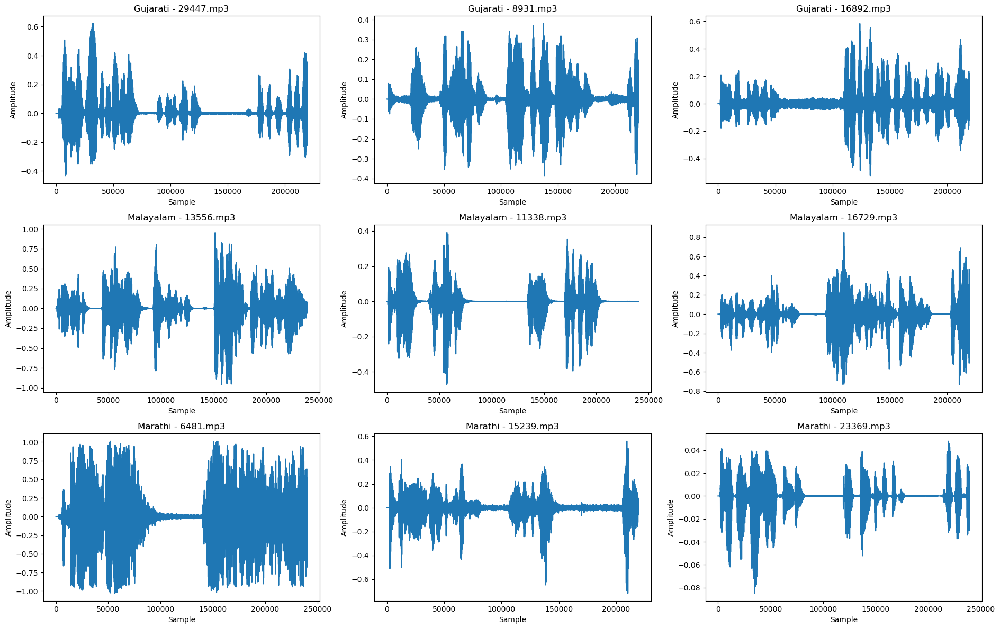

In [61]:
plt.figure(figsize=(19, 12))
for i in range(len(df_audio)):
    plt.subplot(3, 3, i+1)
    plt.plot(df_audio['y'][i])
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.title(f'{df_audio["class"][i]} - {df_audio["file"][i]}')

plt.tight_layout()
plt.show()

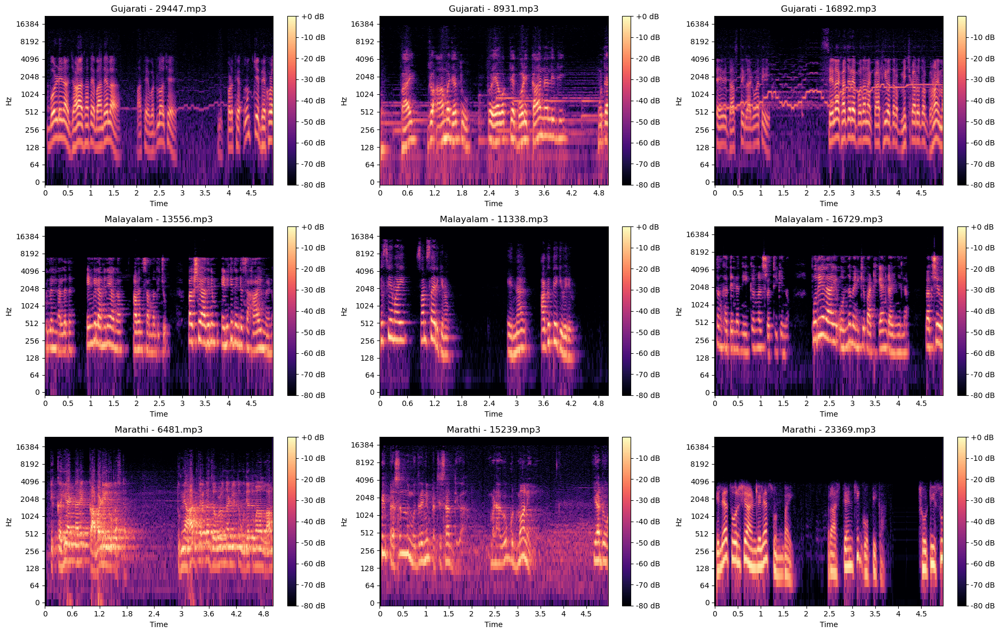

In [62]:
# spectrogram
plt.figure(figsize=(19, 12))
for i in range(len(df_audio)):
    plt.subplot(3, 3, i+1)
    stft = librosa.stft(df_audio['y'][i])
    spectrogram = librosa.amplitude_to_db(np.abs(stft), ref=np.max)

    librosa.display.specshow(spectrogram, sr=df_audio['sr'][i], x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'{df_audio["class"][i]} - {df_audio["file"][i]}')
    
plt.tight_layout()
plt.show()

Class Imbalance

In [67]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
df_amp_dur = pd.read_csv('processed_data_full.csv')

In [69]:
counts = pd.DataFrame(df_amp_dur['class'].value_counts()).reset_index()
counts.columns = ['class', 'count']
counts.sort_values(by='count', inplace=True)
counts.reset_index(drop=True, inplace=True)
counts

,class,count
0,Kannada,21627
1,Telugu,23652
2,Malayalam,23999
3,Tamil,24192
4,Marathi,24755
5,Hindi,25453
6,Gujarati,26226
7,Bengali,27214
8,Urdu,30554


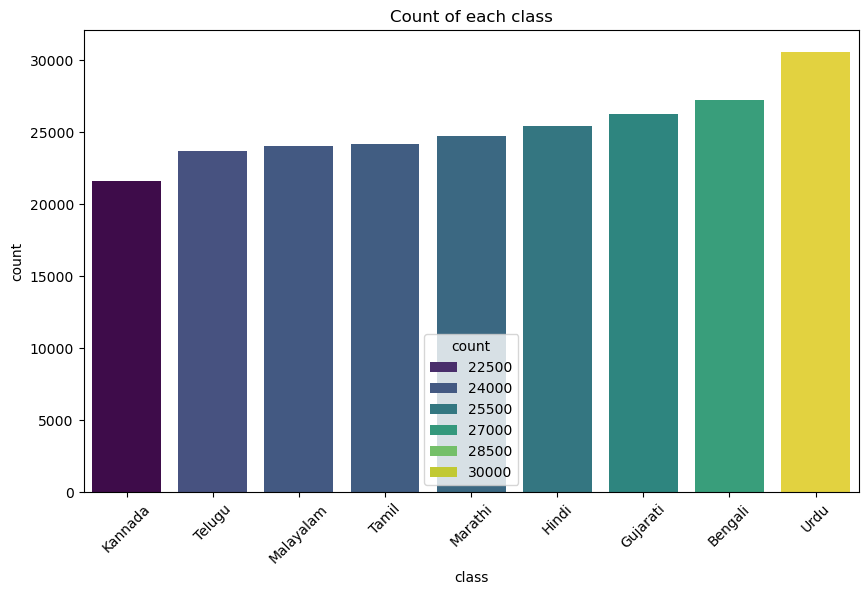

In [71]:
plt.figure(figsize=(10, 6))
sns.barplot(x='class', y='count', data=counts, hue='count', palette='viridis')
plt.xticks(rotation=45)
plt.title('Count of each class')
plt.show()

Cleaning

In [76]:
for class_ in os.listdir(path):
    class_path = os.path.join(path, class_)

    # ✅ Skip files (e.g., .DS_Store) and process only directories
    if not os.path.isdir(class_path):
        continue  

    for file in os.listdir(class_path):
        if file.startswith('cleaned_'):
            os.remove(os.path.join(class_path, file))

print("Cleaned all 'cleaned_' files.")


Cleaned all 'cleaned_' files.


In [78]:
import os
import librosa
import numpy as np
import soundfile as sf

for class_ in os.listdir(path):
    if class_ == 'Punjabi':
        continue

    class_path = os.path.join(path, class_)
    if not os.path.isdir(class_path):  # Ensure it's a directory
        continue

    for file in os.listdir(class_path):
        if file.endswith('.mp3'):
            file_path = os.path.join(class_path, file)
            
            try:
                y, sr = librosa.load(file_path, sr=None)
            except Exception as e:
                print(f"Error loading {file_path}: {e}")
                continue
            
            # ✅ Skip empty files
            if y is None or len(y) == 0:
                print(f"Skipping empty file: {file_path}")
                continue  

            y = librosa.util.normalize(y)

            silence_segments = librosa.effects.split(y, top_db=20)
            if len(silence_segments) == 0:  # Handle completely silent files
                print(f"Skipping silent file: {file_path}")
                continue

            cleaned_audio = np.concatenate([y[start:end] for start, end in silence_segments])

            target_duration = 5 * sr
            if cleaned_audio.shape[0] < target_duration:
                cleaned_audio = np.pad(cleaned_audio, (0, target_duration - cleaned_audio.shape[0]))
            elif cleaned_audio.shape[0] > target_duration:
                cleaned_audio = cleaned_audio[:target_duration]

            cleaned_file_path = os.path.join(class_path, f'cleaned_{file}')
            sf.write(cleaned_file_path, cleaned_audio, sr)

    print("Cleaned:", class_)


Error loading dataset/Gujarati/13430.mp3: frames must be specified for non-seekable files
Error loading dataset/Gujarati/23780.mp3: frames must be specified for non-seekable files


/var/folders/ft/ksjmg7nn2tl18xwghcvb4j0r0000gn/T/ipykernel_1447/2088206038.py:19: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=None)
/Applications/anaconda3/lib/python3.12/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Skipping empty file: dataset/Gujarati/5774.mp3
Error loading dataset/Gujarati/18532.mp3: frames must be specified for non-seekable files
Skipping empty file: dataset/Gujarati/12867.mp3
Cleaned: Gujarati
Cleaned: Malayalam
Cleaned: Hindi
Cleaned: Telugu
Cleaned: Kannada
Skipping empty file: dataset/Tamil/23613.mp3
Cleaned: Tamil
Skipping empty file: dataset/Marathi/24094.mp3
Cleaned: Marathi
Cleaned: Bengali


In [79]:
#remove noisey files
path = "dataset"
cleaned_df = []

for class_ in os.listdir(path):
    class_path = os.path.join(path, class_)

    # ✅ Skip non-directory files (e.g., .DS_Store)
    if not os.path.isdir(class_path):
        continue

    for file in os.listdir(class_path):
        if file.endswith('.mp3') and file.startswith('cleaned_'):
            file_path = os.path.join(class_path, file)
            try:
                y, sr = librosa.load(file_path, sr=None)
            except Exception as e:
                print(f"Error loading {file_path}: {e}")
                continue

            snr = librosa.feature.spectral_flatness(y=y)

            if np.mean(snr) < 0.02:
                os.remove(file_path)
            else:
                cleaned_df.append({'file': file, 'class': class_})  

    print("Removed:", class_)

cleaned_df = pd.DataFrame(cleaned_df)
cleaned_df.sort_values(by='class', inplace=True)
cleaned_df.reset_index(drop=True, inplace=True)
cleaned_df


Removed: Gujarati
Removed: Punjabi
Removed: Malayalam
Removed: Hindi
Removed: Telugu
Removed: Kannada
Removed: Tamil
Removed: Marathi
Removed: Bengali


,file,class
0,cleaned_13908.mp3,Bengali
1,cleaned_5015.mp3,Bengali
2,cleaned_11551.mp3,Bengali
3,cleaned_20954.mp3,Bengali
4,cleaned_3464.mp3,Bengali
...,...,...
179012,cleaned_11350.mp3,Telugu
179013,cleaned_12659.mp3,Telugu
179014,cleaned_15136.mp3,Telugu
179015,cleaned_13584.mp3,Telugu


In [80]:
# play one cleaned audio
y, sr = librosa.load('dataset/Hindi/cleaned_8005.mp3', sr=None)
ipd.display(ipd.Audio(y, rate=sr))

In [81]:
count_clean = pd.DataFrame(cleaned_df['class'].value_counts()).reset_index()
count_clean.columns = ['class', 'count']
count_clean.sort_values(by='count', inplace=True)
count_clean.reset_index(drop=True, inplace=True)
count_clean

,class,count
0,Telugu,5551
1,Kannada,21627
2,Malayalam,23999
3,Tamil,24192
4,Marathi,24755
5,Hindi,25453
6,Gujarati,26226
7,Bengali,27214


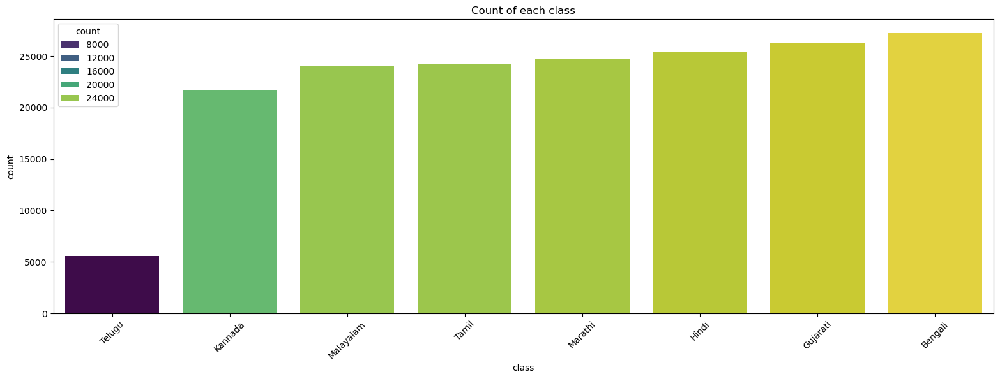

In [82]:
plt.figure(figsize=(19, 6))
sns.barplot(x='class', y='count', data=count_clean, hue='count', palette='viridis')
plt.xticks(rotation=45)
plt.title('Count of each class')
plt.show()

Feature Extraction

In [102]:
import os
import librosa
import numpy as np

path = "dataset"
features = []
class_names = []
audio_files = []

for class_ in os.listdir(path):
    class_path = os.path.join(path, class_)
    
    # ✅ Skip files (e.g., .DS_Store) and process only directories
    if not os.path.isdir(class_path):
        continue  
    
    for file in os.listdir(class_path):
        if file.endswith('.mp3') and file.startswith('cleaned_'):
            file_path = os.path.join(cl ass_path, file)
            try:
                audio, sr = librosa.load(file_path, sr=None)
            except Exception as e:
                print(e)
                continue

            # mfcc
            mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=25)
            mfcc_mean = np.mean(mfcc, axis=1)

            mfcc_delta = librosa.feature.delta(mfcc)
            mfcc_delta_mean = np.mean(mfcc_delta, axis=1)

            # Spectral
            spectral_centroid = librosa.feature.spectral_centroid(y=audio, sr=sr)
            spectral_centroid_mean = np.mean(spectral_centroid)

            spectral_bandwidth = librosa.feature.spectral_bandwidth(y=audio, sr=sr)
            spectral_bandwidth_mean = np.mean(spectral_bandwidth)

            spectral_contrast = librosa.feature.spectral_contrast(y=audio, sr=sr)
            spectral_contrast_mean = np.mean(spectral_contrast)

            spectral_flatness = librosa.feature.spectral_flatness(y=audio)
            spectral_flatness_mean = np.mean(spectral_flatness)

            spectral_rolloff = librosa.feature.spectral_rolloff(y=audio, sr=sr)
            spectral_rolloff_mean = np.mean(spectral_rolloff)

            # Chroma
            chroma_stft = librosa.feature.chroma_stft(y=audio, sr=sr)
            chroma_stft_mean = np.mean(chroma_stft, axis=1)

            features.append({
                'mfcc1': mfcc_mean[0], 'mfcc2': mfcc_mean[1], 'mfcc3': mfcc_mean[2], 'mfcc4': mfcc_mean[3], 'mfcc5': mfcc_mean[4],
                'mfcc6': mfcc_mean[5], 'mfcc7': mfcc_mean[6], 'mfcc8': mfcc_mean[7], 'mfcc9': mfcc_mean[8], 'mfcc10': mfcc_mean[9],
                'mfcc11': mfcc_mean[10], 'mfcc12': mfcc_mean[11], 'mfcc13': mfcc_mean[12], 'mfcc14': mfcc_mean[13], 'mfcc15': mfcc_mean[14],
                'mfcc16': mfcc_mean[15], 'mfcc17': mfcc_mean[16], 'mfcc18': mfcc_mean[17], 'mfcc19': mfcc_mean[18], 'mfcc20': mfcc_mean[19],
                'mfcc21': mfcc_mean[20], 'mfcc22': mfcc_mean[21], 'mfcc23': mfcc_mean[22], 'mfcc24': mfcc_mean[23], 'mfcc25': mfcc_mean[24],
                'mfcc_delta1': mfcc_delta_mean[0], 'mfcc_delta2': mfcc_delta_mean[1], 'mfcc_delta3': mfcc_delta_mean[2],
                'mfcc_delta4': mfcc_delta_mean[3], 'mfcc_delta5': mfcc_delta_mean[4], 'mfcc_delta6': mfcc_delta_mean[5],
                'mfcc_delta7': mfcc_delta_mean[6], 'mfcc_delta8': mfcc_delta_mean[7], 'mfcc_delta9': mfcc_delta_mean[8],
                'mfcc_delta10': mfcc_delta_mean[9], 'mfcc_delta11': mfcc_delta_mean[10], 'mfcc_delta12': mfcc_delta_mean[11],
                'mfcc_delta13': mfcc_delta_mean[12], 'mfcc_delta14': mfcc_delta_mean[13], 'mfcc_delta15': mfcc_delta_mean[14],
                'mfcc_delta16': mfcc_delta_mean[15], 'mfcc_delta17': mfcc_delta_mean[16], 'mfcc_delta18': mfcc_delta_mean[17],
                'mfcc_delta19': mfcc_delta_mean[18], 'mfcc_delta20': mfcc_delta_mean[19], 'mfcc_delta21': mfcc_delta_mean[20],
                'mfcc_delta22': mfcc_delta_mean[21], 'mfcc_delta23': mfcc_delta_mean[22], 'mfcc_delta24': mfcc_delta_mean[23],
                'mfcc_delta25': mfcc_delta_mean[24],
                'spectral_centroid': spectral_centroid_mean, 'spectral_bandwidth': spectral_bandwidth_mean, 'spectral_contrast': spectral_contrast_mean,
                'spectral_flatness': spectral_flatness_mean, 'spectral_rolloff': spectral_rolloff_mean,
                'chroma_stft1': chroma_stft_mean[0], 'chroma_stft2': chroma_stft_mean[1], 'chroma_stft3': chroma_stft_mean[2], 'chroma_stft4': chroma_stft_mean[3],
                'chroma_stft5': chroma_stft_mean[4], 'chroma_stft6': chroma_stft_mean[5], 'chroma_stft7': chroma_stft_mean[6], 'chroma_stft8': chroma_stft_mean[7],
                'chroma_stft9': chroma_stft_mean[8], 'chroma_stft10': chroma_stft_mean[9], 'chroma_stft11': chroma_stft_mean[10], 'chroma_stft12': chroma_stft_mean[11]
            })

            class_names.append(class_)
            audio_files.append(file)
    print("Language done:", class_)


/Applications/anaconda3/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


Language done: Gujarati
Language done: Punjabi
Language done: Malayalam
Language done: Hindi
Language done: Telugu
Language done: Kannada
Language done: Tamil
Language done: Marathi
Language done: Bengali


In [103]:
features_df = pd.DataFrame(features)
features_df['class'] = class_names
features_df['audio'] = audio_files
features_df

,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,...,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,chroma_stft9,chroma_stft10,chroma_stft11,chroma_stft12,class,audio
0,-368.359894,128.976471,-18.045475,-8.433118,5.411959,-6.566223,-24.735229,-4.853865,-1.905876,-19.622494,...,0.196163,0.209513,0.223204,0.197675,0.139000,0.122996,0.146039,0.181025,Gujarati,cleaned_22514.mp3
1,-420.016663,83.938553,-12.095988,-5.556345,6.071991,1.640748,-12.969543,-8.748064,-6.964681,-10.192943,...,0.121505,0.136517,0.165873,0.189614,0.142058,0.113743,0.109515,0.112813,Gujarati,cleaned_13911.mp3
2,-309.441223,142.335175,-21.271082,-9.566379,-4.643619,-3.016943,-18.507853,-9.208827,-5.110234,-20.736101,...,0.307458,0.317706,0.354409,0.367306,0.155828,0.111913,0.110602,0.158471,Gujarati,cleaned_6193.mp3
3,-336.720123,139.343933,-23.199776,-14.445911,9.685696,-4.607529,-25.117743,-5.430351,-7.546618,-20.621038,...,0.205763,0.252625,0.313673,0.261400,0.191998,0.123124,0.119560,0.131546,Gujarati,cleaned_24165.mp3
4,-391.856079,103.199593,-8.523324,-11.773825,0.436807,-8.249401,-14.340284,-4.699822,-1.322498,-11.875917,...,0.191510,0.209985,0.199516,0.159845,0.099603,0.073621,0.077064,0.100346,Gujarati,cleaned_16869.mp3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179012,-331.564575,122.698326,-8.043685,42.685242,9.206250,17.224297,-20.540447,-0.234644,5.994570,-9.516349,...,0.279108,0.328854,0.388080,0.413353,0.427197,0.434290,0.458254,0.404847,Bengali,cleaned_23613.mp3
179013,-349.051666,105.757645,-10.880782,23.137129,-2.433572,8.088401,-12.093775,0.449660,9.423176,-5.956735,...,0.279645,0.312451,0.338213,0.364098,0.389405,0.363488,0.311115,0.268594,Bengali,cleaned_7294.mp3
179014,-264.023102,128.872833,-6.019796,36.159458,-3.666281,16.181082,-19.144146,-8.631113,15.329778,-20.122366,...,0.371793,0.268079,0.178045,0.140504,0.149103,0.218114,0.325796,0.290385,Bengali,cleaned_25262.mp3
179015,-404.131287,96.995392,-6.969598,32.163681,2.952832,16.313005,-2.601515,5.101060,4.306140,-5.347642,...,0.220128,0.257462,0.287813,0.310192,0.356822,0.384498,0.388899,0.345426,Bengali,cleaned_931.mp3


In [104]:
# bring the class column to the front
cols = features_df.columns.tolist()
cols = cols[-1:] + cols[:-1]
features_df = features_df[cols]
features_df

,audio,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,...,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,chroma_stft9,chroma_stft10,chroma_stft11,chroma_stft12,class
0,cleaned_22514.mp3,-368.359894,128.976471,-18.045475,-8.433118,5.411959,-6.566223,-24.735229,-4.853865,-1.905876,...,0.202227,0.196163,0.209513,0.223204,0.197675,0.139000,0.122996,0.146039,0.181025,Gujarati
1,cleaned_13911.mp3,-420.016663,83.938553,-12.095988,-5.556345,6.071991,1.640748,-12.969543,-8.748064,-6.964681,...,0.139428,0.121505,0.136517,0.165873,0.189614,0.142058,0.113743,0.109515,0.112813,Gujarati
2,cleaned_6193.mp3,-309.441223,142.335175,-21.271082,-9.566379,-4.643619,-3.016943,-18.507853,-9.208827,-5.110234,...,0.295113,0.307458,0.317706,0.354409,0.367306,0.155828,0.111913,0.110602,0.158471,Gujarati
3,cleaned_24165.mp3,-336.720123,139.343933,-23.199776,-14.445911,9.685696,-4.607529,-25.117743,-5.430351,-7.546618,...,0.199796,0.205763,0.252625,0.313673,0.261400,0.191998,0.123124,0.119560,0.131546,Gujarati
4,cleaned_16869.mp3,-391.856079,103.199593,-8.523324,-11.773825,0.436807,-8.249401,-14.340284,-4.699822,-1.322498,...,0.180445,0.191510,0.209985,0.199516,0.159845,0.099603,0.073621,0.077064,0.100346,Gujarati
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179012,cleaned_23613.mp3,-331.564575,122.698326,-8.043685,42.685242,9.206250,17.224297,-20.540447,-0.234644,5.994570,...,0.239158,0.279108,0.328854,0.388080,0.413353,0.427197,0.434290,0.458254,0.404847,Bengali
179013,cleaned_7294.mp3,-349.051666,105.757645,-10.880782,23.137129,-2.433572,8.088401,-12.093775,0.449660,9.423176,...,0.244124,0.279645,0.312451,0.338213,0.364098,0.389405,0.363488,0.311115,0.268594,Bengali
179014,cleaned_25262.mp3,-264.023102,128.872833,-6.019796,36.159458,-3.666281,16.181082,-19.144146,-8.631113,15.329778,...,0.441282,0.371793,0.268079,0.178045,0.140504,0.149103,0.218114,0.325796,0.290385,Bengali
179015,cleaned_931.mp3,-404.131287,96.995392,-6.969598,32.163681,2.952832,16.313005,-2.601515,5.101060,4.306140,...,0.202902,0.220128,0.257462,0.287813,0.310192,0.356822,0.384498,0.388899,0.345426,Bengali


In [113]:
features_df = features_df.sample(frac=1, random_state=42).reset_index(drop=True)
features_df.to_csv('data/processed_data_full.csv', index=False)

In [120]:
import os

path = "dataset"

# Remove all 'cleaned_' files
for class_ in os.listdir(path):
    class_path = os.path.join(path, class_)
    
    # Skip non-directory files like .DS_Store
    if not os.path.isdir(class_path):
        continue

    for file in os.listdir(class_path):
        if file.startswith('cleaned_'):
            os.remove(os.path.join(class_path, file))

print("Removed all 'cleaned_' files.")


Removed all 'cleaned_' files.


In [122]:
full_df = pd.read_csv('data/processed_data_full.csv')
full_df

,audio,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,...,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,chroma_stft9,chroma_stft10,chroma_stft11,chroma_stft12,class
0,cleaned_9167.mp3,-230.88820,127.881310,-97.354300,22.749096,-38.050144,-8.866067,-9.577093,-33.962803,10.267275,...,0.252047,0.267637,0.183492,0.163468,0.211562,0.217781,0.298591,0.362623,0.350620,Kannada
1,cleaned_10360.mp3,-319.90225,111.102905,-7.510077,27.595060,-3.328165,5.987702,2.072924,5.042234,7.517483,...,0.355425,0.375078,0.389735,0.342536,0.297474,0.268281,0.275895,0.304535,0.287610,Hindi
2,cleaned_16093.mp3,-400.04538,58.514076,-1.907893,20.764425,-13.259652,9.739310,-6.689917,-4.044855,-7.281422,...,0.189190,0.208865,0.218581,0.261047,0.216016,0.159607,0.130502,0.152102,0.183070,Hindi
3,cleaned_7629.mp3,-286.79388,103.182930,0.141504,7.068603,4.767405,6.976820,-11.246504,-10.972268,-12.593707,...,0.146248,0.131254,0.096827,0.092012,0.119294,0.151491,0.209447,0.285996,0.305611,Tamil
4,cleaned_20771.mp3,-358.24740,113.063980,-43.514860,-14.235402,6.537755,-26.258299,-7.914073,6.357630,-13.180340,...,0.301274,0.237942,0.191617,0.214758,0.198707,0.208391,0.193018,0.169582,0.174052,Kannada
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179012,cleaned_16291.mp3,-331.60837,95.232640,3.125760,14.823277,-6.746803,30.313955,-6.609580,-5.594699,-6.361108,...,0.215574,0.251960,0.348160,0.357367,0.249649,0.170591,0.179828,0.229971,0.220438,Marathi
179013,cleaned_17191.mp3,-392.30120,98.747910,8.718032,2.322515,-5.015669,4.818001,0.611000,-5.514686,-2.298019,...,0.194520,0.202134,0.204284,0.193664,0.144450,0.139995,0.161710,0.202130,0.208180,Bengali
179014,cleaned_22133.mp3,-278.16302,110.340580,-12.299334,7.755728,7.753451,0.322464,-13.678727,-8.819210,-5.313819,...,0.113908,0.100893,0.084461,0.124678,0.249312,0.350946,0.328074,0.252226,0.220588,Tamil
179015,cleaned_12248.mp3,-409.65850,56.620080,-7.733880,26.514797,-11.139907,16.919893,-19.641703,3.554161,-11.874303,...,0.224406,0.221562,0.212124,0.185305,0.182448,0.191696,0.175225,0.210426,0.213463,Hindi


In [123]:
X = full_df.drop(['class', 'audio'], axis=1)
y = full_df['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

In [126]:
train_df = pd.concat([X_train, y_train], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)

train_df.to_csv('data/data_train.csv', index=False)
test_df.to_csv('data/data_test.csv', index=False)